In [48]:
# Install CatBoost library, a popular gradient boosting framework for machine learning
!pip install catboost

# Importing essential libraries for data manipulation, numerical computations, and visualization
import pandas as pd               # For data manipulation and analysis
import numpy as np                # For numerical computations
import seaborn as sns             # For data visualization
import matplotlib.pyplot as plt   # Another library for plotting data
import missingno as msno          # For visualizing missing data

# Importing statistical libraries
from scipy import stats           # For statistical functions
from scipy.stats import norm      # For working with normal distribution

# Importing machine learning preprocessing and metrics
from sklearn.preprocessing import StandardScaler  # For feature scaling
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error  # For evaluating model performance

# Importing model selection and validation tools
from sklearn.model_selection import train_test_split, cross_val_score, KFold, RandomizedSearchCV, GridSearchCV  # For splitting data, cross-validation, and hyperparameter tuning

# Importing statistical modeling tools
import statsmodels.api as sm  # For building statistical models
from sklearn.feature_selection import RFE  # Recursive feature elimination for feature selection
from statsmodels.stats.outliers_influence import variance_inflation_factor  # For calculating VIF to check multicollinearity

# Importing regression models from different libraries
from catboost import CatBoostRegressor  # CatBoost regression model
from sklearn.linear_model import BayesianRidge, HuberRegressor, Ridge, OrthogonalMatchingPursuit, LinearRegression, Lasso, ElasticNet  # Various linear models
from sklearn.svm import SVR  # Support Vector Regression
from sklearn.tree import DecisionTreeRegressor  # Decision Tree for regression
from lightgbm import LGBMRegressor  # LightGBM regression model
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor  # Ensemble models for regression
from xgboost import XGBRegressor  # XGBoost regression model

# Importing classification models
from sklearn.linear_model import LogisticRegression  # Logistic Regression for classification
from sklearn.svm import SVC  # Support Vector Classification
from sklearn.tree import DecisionTreeClassifier  # Decision Tree for classification
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Ensemble models for classification

# Importing clustering algorithms
from sklearn.cluster import KMeans  # KMeans clustering

# Importing deep learning libraries
import tensorflow as tf  # TensorFlow for deep learning
from tensorflow.keras.models import Sequential  # Sequential model in Keras
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten  # Various layers in Keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Data augmentation for images
from tensorflow.keras.callbacks import EarlyStopping  # Early stopping to prevent overfitting

# Importing additional tools for file handling and system operations
import zipfile  # To work with zip files
import os       # To interact with the operating system for file paths and directories

# Additional imports for handling categorical variables
from sklearn.preprocessing import OneHotEncoder, LabelEncoder  # Encoding categorical features

# Importing model evaluation metrics for classification
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report  # For evaluating classification models

# Saving and loading models
import joblib  # For saving and loading trained models

# Additional tools for displaying data
from tabulate import tabulate  # For displaying data in tabular format

In [49]:
# Using wget to download the UK Used Car Dataset from a Dropbox link
# The dataset will be saved as "UK_Used_Car_Dataset.zip" in the current working directory
!wget -O UK_Used_Car_Dataset.zip https://www.dropbox.com/scl/fi/k3ba5m82uprao9xug3plf/100-000-UK-Used-Car-Data-set.zip?rlkey=feafhcpz40vc284l234xf5ba0&st=e1y5abhr&dl=0

# Define the path to the downloaded zip file
zip_file_path = 'UK_Used_Car_Dataset.zip'

# Define the directory where the zip file will be extracted
extract_dir = 'UK_Used_Car_Dataset'

# Define the specific directory within the extracted folder where the CSV files are located
file_dir = 'UK_Used_Car_Dataset/100,000 UK Used Car Data set'

# Extract all the contents of the zip file to the specified directory
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# List all files in the extracted directory to confirm extraction and view contents
extracted_files = os.listdir(file_dir)
print("Extracted files:", extracted_files)

# Filter the list of files to only include CSV files, assuming all relevant data files are in CSV format
csv_files = [file for file in extracted_files if file.endswith('.csv')]

# Read each CSV file into a pandas DataFrame and store them in a dictionary for easy access
# Individual DataFrames for each car brand's data are also created
audi = pd.read_csv(file_dir + '/audi.csv')
audi['brand'] = 'audi'
bmw = pd.read_csv(file_dir + '/bmw.csv')
bmw['brand'] = 'bmw'
ford = pd.read_csv(file_dir + '/ford.csv')
ford['brand'] = 'ford'
hyundai = pd.read_csv(file_dir + '/hyundi.csv')
hyundai['brand'] = 'hyundai'
hyundai.rename(columns={'tax(£)':'tax'},inplace=True)
merc = pd.read_csv(file_dir + '/merc.csv')
merc['brand'] = 'merc'
skoda = pd.read_csv(file_dir + '/skoda.csv')
skoda['brand'] = 'skoda'
toyota = pd.read_csv(file_dir + '/toyota.csv')
toyota['brand'] = 'toyota'
vauxhall = pd.read_csv(file_dir + '/vauxhall.csv')
vauxhall['brand'] = 'vauxhall'
vw = pd.read_csv(file_dir + '/vw.csv')
vw['brand'] = 'vw'
# Combine all individual DataFrames into a single DataFrame
# This concatenates the data from all the car brands into one large dataset
df = pd.concat([audi, bmw, ford, hyundai, merc, skoda, toyota, vauxhall, vw])

--2024-08-06 05:09:41--  https://www.dropbox.com/scl/fi/k3ba5m82uprao9xug3plf/100-000-UK-Used-Car-Data-set.zip?rlkey=feafhcpz40vc284l234xf5ba0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uccc2696ab37df20de608b8f910c.dl.dropboxusercontent.com/cd/0/inline/CYEkPcV-FtiSJR9sw05WITqoS_Irqt2iX-MaUNS13X9J7AaveX4cV7izCbpxLUPH0ivh2T31Ws8GZUOTn54Prb2qfUm9h5lDNhihUHGS7NoFd-4FNRHhz6eRx8BdfFAc-_HDXTijHAIAXzSELvljj1Sc/file# [following]
--2024-08-06 05:09:42--  https://uccc2696ab37df20de608b8f910c.dl.dropboxusercontent.com/cd/0/inline/CYEkPcV-FtiSJR9sw05WITqoS_Irqt2iX-MaUNS13X9J7AaveX4cV7izCbpxLUPH0ivh2T31Ws8GZUOTn54Prb2qfUm9h5lDNhihUHGS7NoFd-4FNRHhz6eRx8BdfFAc-_HDXTijHAIAXzSELvljj1Sc/file
Resolving uccc2696ab37df20de608b8f910c.dl.dropboxusercontent.com (uccc2696ab37df20de608b8f910c.dl.dropboxusercontent.com)...

In [50]:
df.isnull().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64

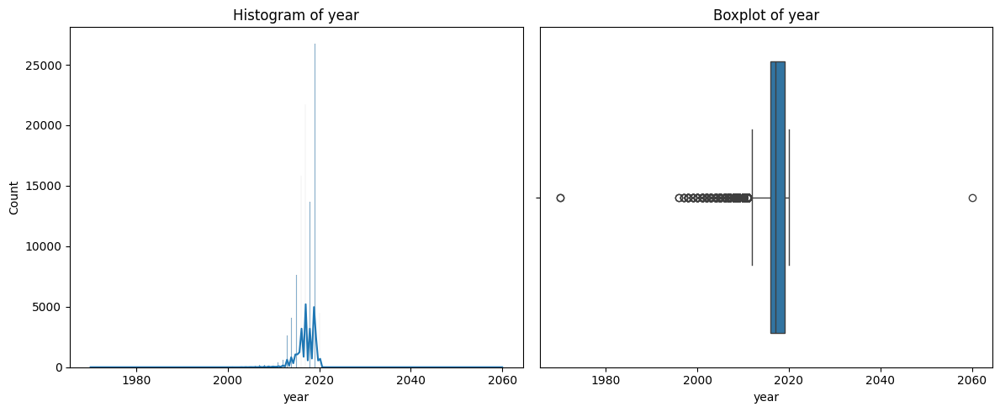

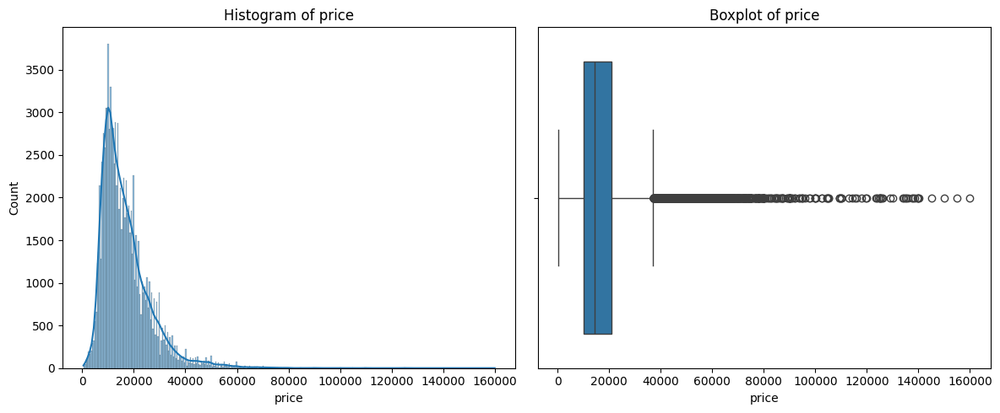

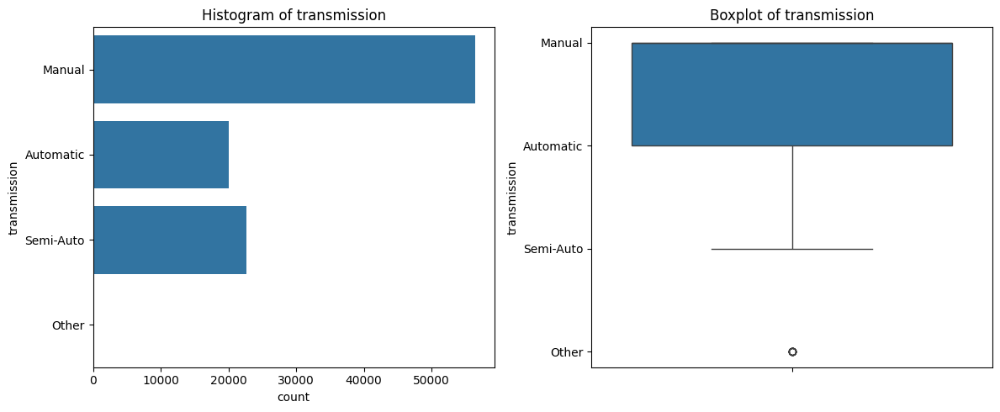

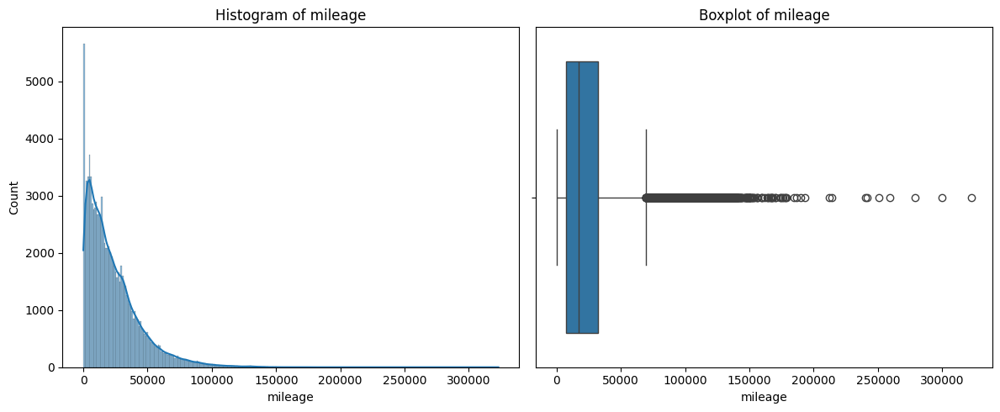

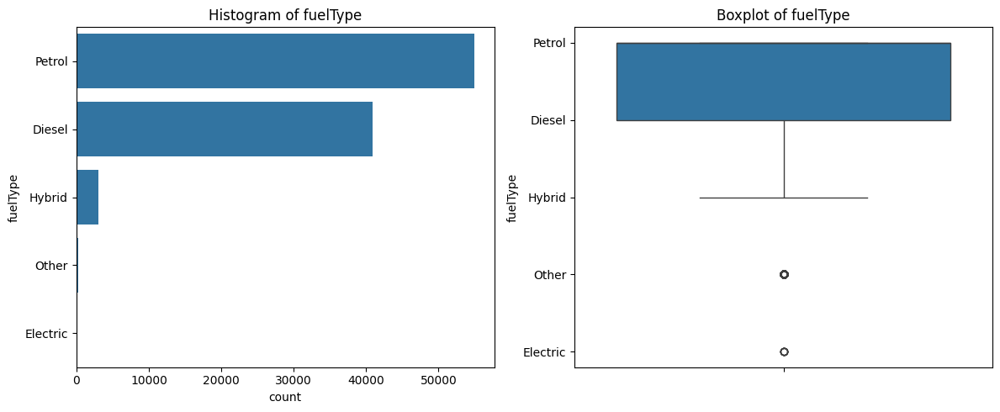

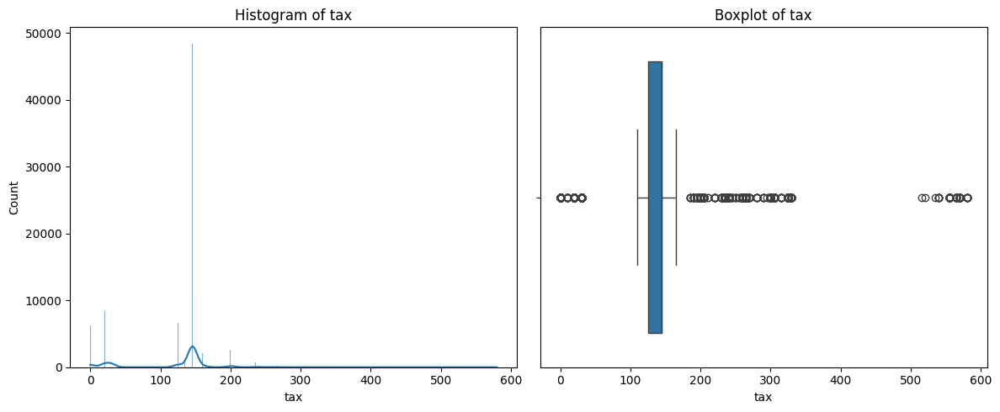

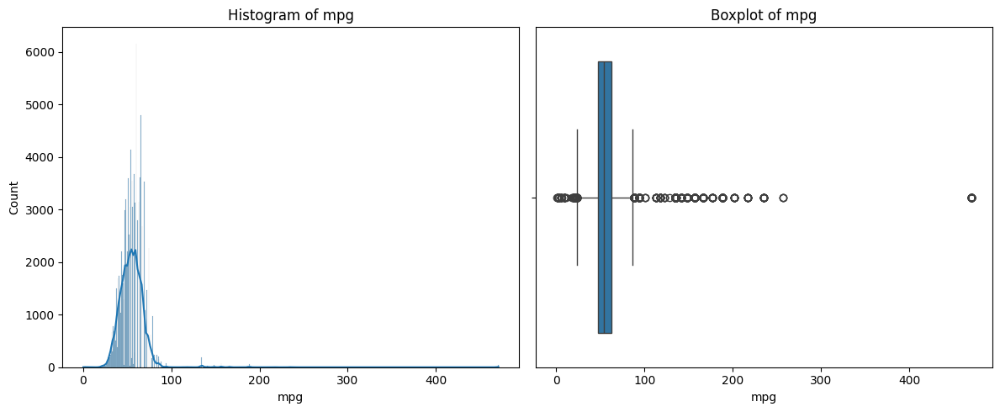

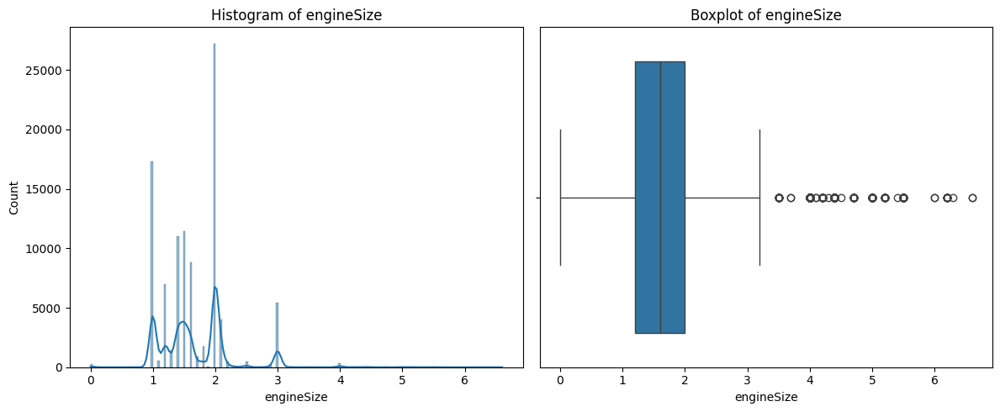

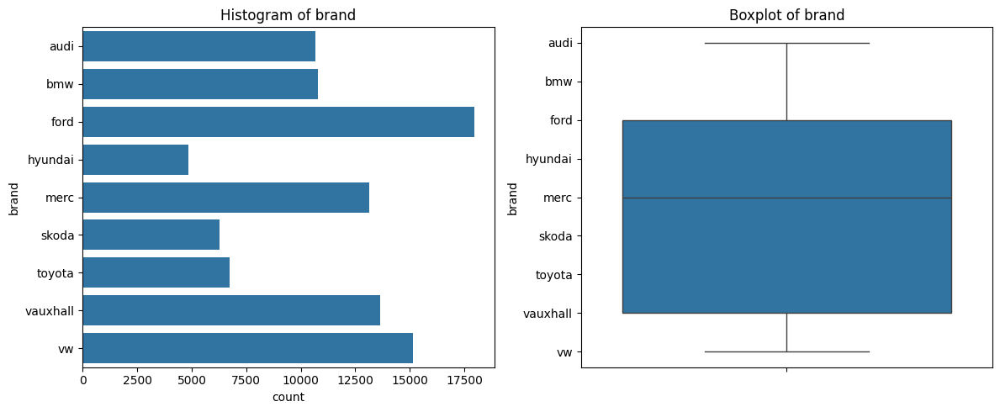

In [51]:
# List of variables to plot
variables = ['year', 'price', 'transmission', 'mileage', 'fuelType', 'tax', 'mpg', 'engineSize', 'brand']

# Create plots
for var in variables:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    if df[var].dtype in ['int64', 'float64']:
        sns.histplot(df[var], kde=True)
    else:
        sns.countplot(y=df[var])
    plt.title(f'Histogram of {var}')

    # Boxplot
    plt.subplot(1, 2, 2)
    if df[var].dtype in ['int64', 'float64']:
        sns.boxplot(x=df[var])
    else:
        sns.boxplot(y=df[var])
    plt.title(f'Boxplot of {var}')

    plt.tight_layout()
    plt.show()


In [52]:
#Split labels
column_names_list = list(df.columns)
column_names_list.remove('price')
X_train=df[column_names_list]
Y_train=df['price']

# Split the data into training and validation sets 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

###Baseline Linear Regression model - using only numerical features

In [53]:
#Baseline Linear Regression model - using only numerical features
model = LinearRegression()

#define categorical and numerical features
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_features = X_train.select_dtypes(include=['number']).columns.tolist()

# Train the model
model.fit(X_train[numerical_features], y_train)

# Make predictions
y_pred = model.predict(X_test[numerical_features])

# Evaluate the model using MAPE and R^2
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAPE: {mape:.4f}')
print(f'R^2: {r2:.4f}')

MAPE: 0.2778
R^2: 0.6946


### Linear Regression model

####Data Preprocessing

In [54]:
full_datasets_cleaned = df[df["year"] <= 2020]
# Calculate the age of each car and create a new column 'age_of_car'
# The age is calculated by subtracting the 'year' column from 2020
# The dataset is being collected in the year 2020
full_datasets_cleaned["Car_Age"] = 2020 - full_datasets_cleaned["year"]
# Drop columns that have any missing values (NaN) in the dataset
full_datasets_cleaned = full_datasets_cleaned.dropna(axis=1)
# Drop the original 'year' column from the DataFrame
full_datasets_cleaned = full_datasets_cleaned.drop(columns=["year"])

full_datasets_cleaned = full_datasets_cleaned.reset_index(drop=True)

print("Shape of the cleaned dataset:", full_datasets_cleaned.shape)

Shape of the cleaned dataset: (99186, 10)


<ipython-input-54-79d8eee10306>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_datasets_cleaned["Car_Age"] = 2020 - full_datasets_cleaned["year"]


In [55]:
# Check for missing values in the combined dataset
# This will return the count of NaN (missing) values in each column of the dataset
full_datasets_cleaned.isna().sum()

model           0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
Car_Age         0
dtype: int64

In [56]:
# Display the cleaned dataset to verify that the columns with missing values have been removed
print("Shape of the dataset:", full_datasets_cleaned.shape)

Shape of the dataset: (99186, 10)


#### EDA

In [57]:
# Capture the list of feature (column) names from the cleaned dataset
features = full_datasets_cleaned.columns

# SIterate over each feature in the dataset
for feature in features:
    # Calculate the number of unique values in the current feature
    unique_values_count = full_datasets_cleaned[feature].nunique()

    # Print the feature name and the count of unique values it contains
    print(f"{feature} : {unique_values_count}")

# Generate descriptive statistics for the cleaned dataset
# Use describe() to calculate summary statistics like mean, std, min, max for each numeric feature
summary_statistics = full_datasets_cleaned.describe()

# Transpose the resulting DataFrame to make the statistics easier to read by rows instead of columns
summary_statistics_transposed = summary_statistics.T
summary_statistics_transposed

model : 195
price : 13236
transmission : 4
mileage : 42213
fuelType : 5
tax : 48
mpg : 208
engineSize : 40
brand : 9
Car_Age : 26


,count,mean,std,min,25%,50%,75%,max
price,99186.0,16805.451606,9866.768844,450.0,9999.0,14495.0,20870.00,159999.0
mileage,99186.0,23058.594126,21148.390071,1.0,7424.5,17460.0,32337.75,323000.0
tax,99186.0,120.298984,63.150672,0.0,125.0,145.0,145.00,580.0
mpg,99186.0,55.166950,16.138556,0.3,47.1,54.3,62.80,470.8
engineSize,99186.0,1.663283,0.557649,0.0,1.2,1.6,2.00,6.6
Car_Age,99186.0,2.912709,2.119570,0.0,1.0,3.0,4.00,50.0


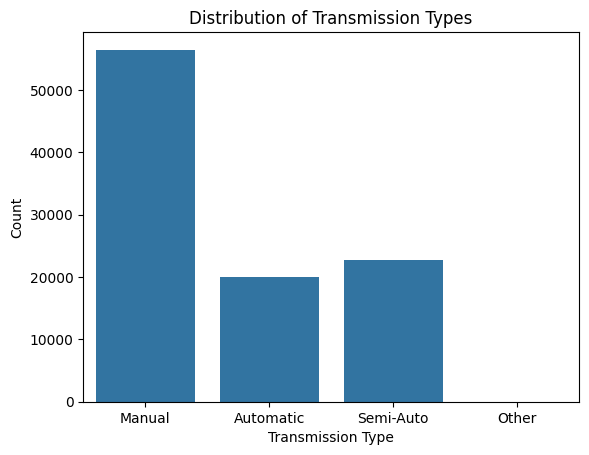

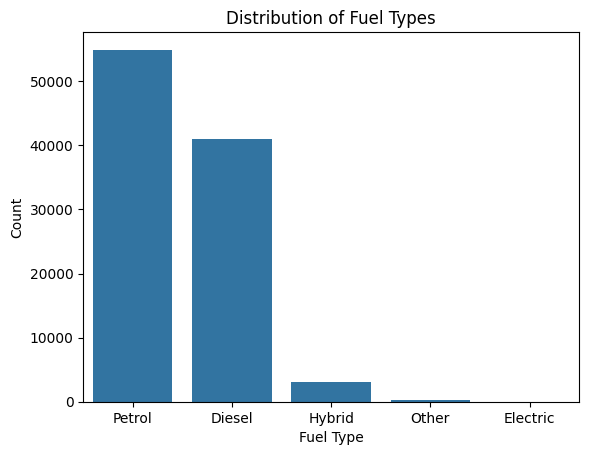

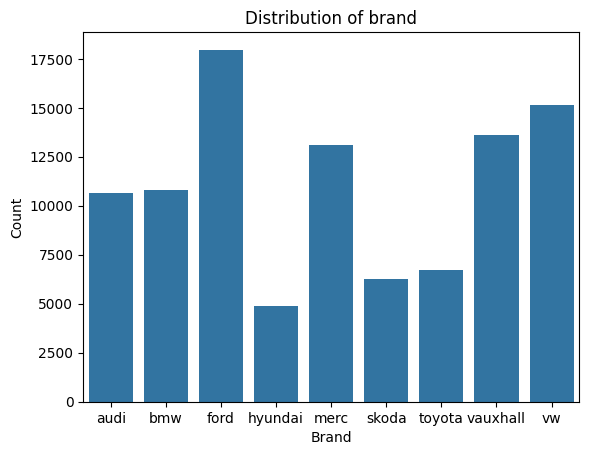

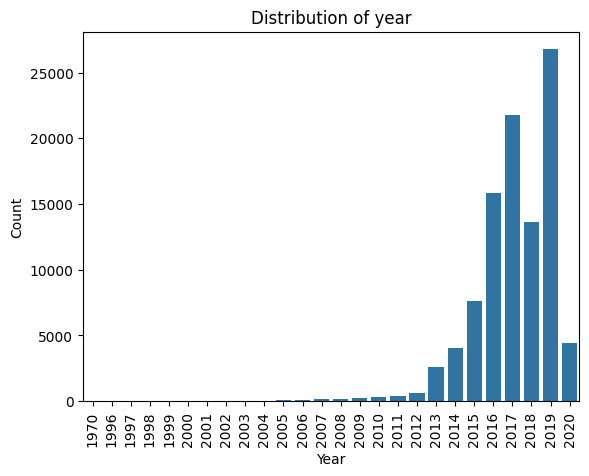

Text(0, 0.5, 'Price')

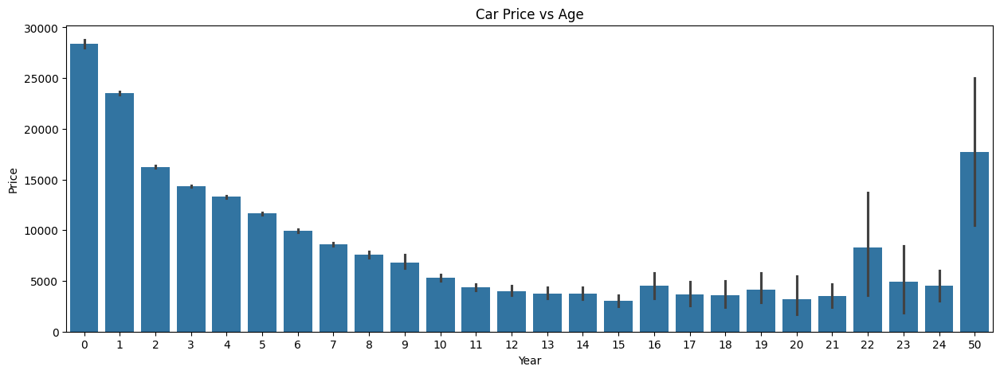

In [58]:
# Plotting the count of each category in the 'transmission' column
sns.countplot(x=full_datasets_cleaned["transmission"])
plt.title("Distribution of Transmission Types")  # Adding a title to the plot
plt.xlabel("Transmission Type")  # Adding a label to the x-axis
plt.ylabel("Count")  # Adding a label to the y-axis
plt.show()  # Display the plot

# Plotting the count of each category in the 'fuelType' column
sns.countplot(x=full_datasets_cleaned["fuelType"])
plt.title("Distribution of Fuel Types")  # Adding a title to the plot
plt.xlabel("Fuel Type")  # Adding a label to the x-axis
plt.ylabel("Count")  # Adding a label to the y-axis
plt.show()  # Display the plot

# Plotting the count of each category in the 'brand' column
sns.countplot(x=full_datasets_cleaned["brand"])
plt.title("Distribution of brand")  # Adding a title to the plot
plt.xlabel("Brand")  # Adding a label to the x-axis
plt.ylabel("Count")  # Adding a label to the y-axis
plt.show()  # Display the plot

# Plotting the count of each category in the 'year' column
sns.countplot(x=2020 - full_datasets_cleaned["Car_Age"])
plt.title("Distribution of year")  # Adding a title to the plot
plt.xlabel("Year")  # Adding a label to the x-axis
plt.ylabel("Count")  # Adding a label to the y-axis
# Rotate x-axis labels by 90 degrees
plt.xticks(rotation=90)
plt.show()  # Display the plot

plt.figure(figsize=(15,5),facecolor='w')
sns.barplot(x = full_datasets_cleaned["Car_Age"], y = full_datasets_cleaned["price"])
plt.title("Car Price vs Age")  # Adding a title to the plot
plt.xlabel("Year")  # Adding a label to the x-axis
plt.ylabel("Price")  # Adding a label to the y-axis

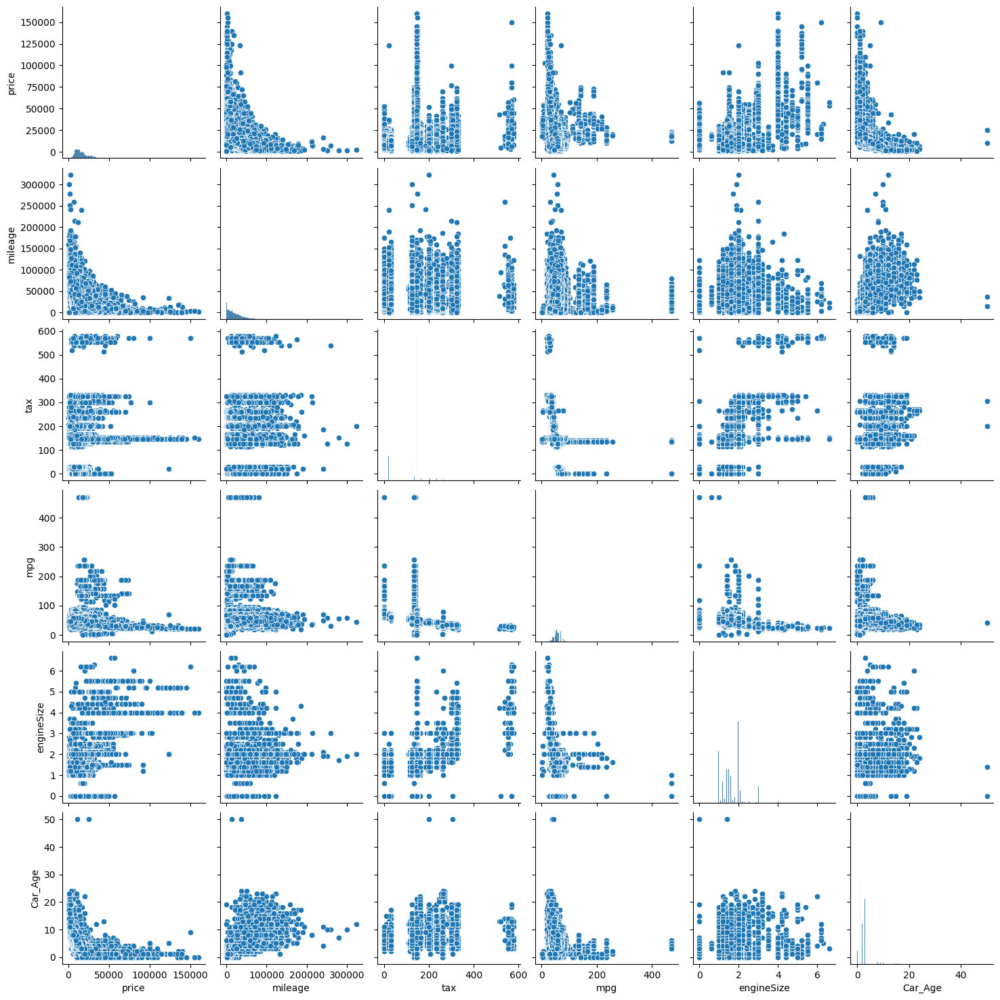

In [59]:
sns.pairplot(full_datasets_cleaned)

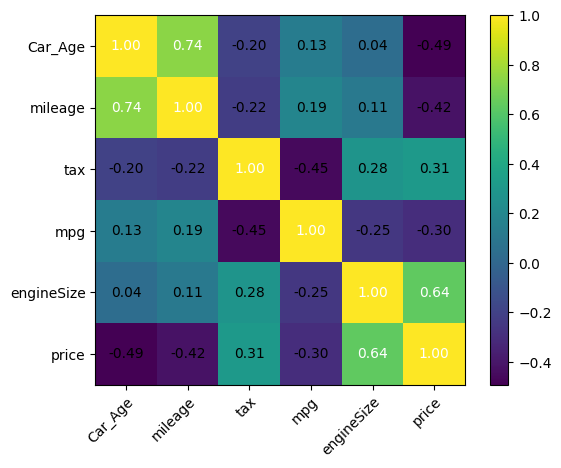

In [60]:
from mlxtend.plotting import heatmap
variables = ['Car_Age',  'mileage',  'tax', 'mpg', 'engineSize', 'price']
cm = full_datasets_cleaned[variables].corr().values
hm = heatmap(
    cm,
    row_names=variables,
    column_names=variables)

In [61]:
full_datasets_cleaned

,model,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand,Car_Age
0,A1,12500,Manual,15735,Petrol,150,55.4,1.4,audi,3
1,A6,16500,Automatic,36203,Diesel,20,64.2,2.0,audi,4
2,A1,11000,Manual,29946,Petrol,30,55.4,1.4,audi,4
3,A4,16800,Automatic,25952,Diesel,145,67.3,2.0,audi,3
4,A3,17300,Manual,1998,Petrol,145,49.6,1.0,audi,1
...,...,...,...,...,...,...,...,...,...,...
99181,Eos,5990,Manual,74000,Diesel,125,58.9,2.0,vw,8
99182,Fox,1799,Manual,88102,Petrol,145,46.3,1.2,vw,12
99183,Fox,1590,Manual,70000,Petrol,200,42.0,1.4,vw,11
99184,Fox,1250,Manual,82704,Petrol,150,46.3,1.2,vw,14


In [62]:
full_datasets_cleaned_dummed = pd.get_dummies(full_datasets_cleaned)
full_datasets_cleaned_dummed.head()

,price,mileage,tax,mpg,engineSize,Car_Age,model_ 1 Series,model_ 2 Series,model_ 3 Series,model_ 4 Series,...,fuelType_Petrol,brand_audi,brand_bmw,brand_ford,brand_hyundai,brand_merc,brand_skoda,brand_toyota,brand_vauxhall,brand_vw
0,12500,15735,150,55.4,1.4,3,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
1,16500,36203,20,64.2,2.0,4,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
2,11000,29946,30,55.4,1.4,4,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
3,16800,25952,145,67.3,2.0,3,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
4,17300,1998,145,49.6,1.0,1,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False


In [63]:
full_datasets_cleaned_dummed_std = pd.DataFrame(full_datasets_cleaned_dummed, columns = full_datasets_cleaned_dummed.columns)
print(full_datasets_cleaned_dummed_std.shape)
full_datasets_cleaned_dummed_std.head()
X_scaled = full_datasets_cleaned_dummed_std.drop(columns=["price"])

(99186, 219)


In [64]:
X_scaled

,mileage,tax,mpg,engineSize,Car_Age,model_ 1 Series,model_ 2 Series,model_ 3 Series,model_ 4 Series,model_ 5 Series,...,fuelType_Petrol,brand_audi,brand_bmw,brand_ford,brand_hyundai,brand_merc,brand_skoda,brand_toyota,brand_vauxhall,brand_vw
0,15735,150,55.4,1.4,3,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
1,36203,20,64.2,2.0,4,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
2,29946,30,55.4,1.4,4,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
3,25952,145,67.3,2.0,3,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
4,1998,145,49.6,1.0,1,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99181,74000,125,58.9,2.0,8,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
99182,88102,145,46.3,1.2,12,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,True
99183,70000,200,42.0,1.4,11,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,True
99184,82704,150,46.3,1.2,14,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,True


In [65]:
y = full_datasets_cleaned_dummed_std['price']
y_log = np.log(y)
# Split the data into training and validation sets 60/20/20
X_train_val, X_test, y_train_val_log, y_test_log = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)
X_train, X_val, y_train_log, y_val_log = train_test_split(X_train_val, y_train_val_log, test_size=0.25, random_state=42)

# Verify the shape of the concatenated dataframes
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")

# Print the shapes of the target dataframes
print(f"y_train shape: {y_train_log.shape}")
print(f"y_val shape: {y_val_log.shape}")
print(f"y_test shape: {y_test_log.shape}")

X_train shape: (59511, 218)
X_val shape: (19837, 218)
X_test shape: (19838, 218)
y_train shape: (59511,)
y_val shape: (19837,)
y_test shape: (19838,)


In [66]:
y_train_val_log

89591     9.877913
68219     9.033961
16980     9.816349
24493     9.432764
11335     9.903388
           ...    
6265     10.402747
54886    10.413253
76820     8.517193
860       9.951801
15795    10.325318
Name: price, Length: 79348, dtype: float64

#### Train model

In [67]:
lr = LinearRegression().fit(X_train_val,y_train_val_log)
y_pred_test_log = pd.DataFrame(lr.predict(X_test))

In [68]:
y_pred_test_log.head()

,0
0,9.333568
1,9.828710
2,9.828756
3,10.054697
4,9.376611


In [69]:
X_test

,mileage,tax,mpg,engineSize,Car_Age,model_ 1 Series,model_ 2 Series,model_ 3 Series,model_ 4 Series,model_ 5 Series,...,fuelType_Petrol,brand_audi,brand_bmw,brand_ford,brand_hyundai,brand_merc,brand_skoda,brand_toyota,brand_vauxhall,brand_vw
31981,14044,150,64.2,1.1,2,False,False,False,False,False,...,True,False,False,True,False,False,False,False,False,False
62387,14258,150,53.3,1.4,2,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False
30462,15,145,65.7,2.0,1,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
21504,24568,145,31.7,2.0,2,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
26653,11373,30,54.3,1.0,3,False,False,False,False,False,...,True,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23917,3541,145,74.3,1.5,1,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
97622,40181,145,42.8,3.0,3,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
89895,18040,145,53.3,2.0,1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
18305,75000,30,62.8,2.0,8,True,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False


In [70]:
y_test_log.head()

31981    9.177714
62387    9.784141
30462    9.878170
21504    9.903238
26653    9.383537
Name: price, dtype: float64

In [71]:
y_pred_test = np.exp(y_pred_test_log)
y_pred_test.rename(columns={0: "price"}, inplace=True)
y_test = np.exp(y_test_log)
y_test = pd.DataFrame(y_test).reset_index(drop=True)

In [72]:
y_pred_test

,price
0,11311.414600
1,18558.989542
2,18559.843792
3,23264.814084
4,11808.932129
...,...
19833,17959.922769
19834,26298.087168
19835,21601.360157
19836,7543.422535


#### Performance Evaluation

In [73]:
# Evaluate the performance of the linear regression model for the Full  dataset
# Calculate R²
r2 = r2_score(y_test, y_pred_test)
print(f'R² on test data: {r2}')

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, y_pred_test)
print(f'Mean Squared Error on test data: {mse}')

# Calculate Mean Absolute Percentage Error
mape = mean_absolute_percentage_error(y_test, y_pred_test)
print(f'Mean Absolute Percentage Error on test data: {mape}')

R² on test data: 0.9291827083644334
Mean Squared Error on test data: 6759186.19076715
Mean Absolute Percentage Error on test data: 0.09641567776369296


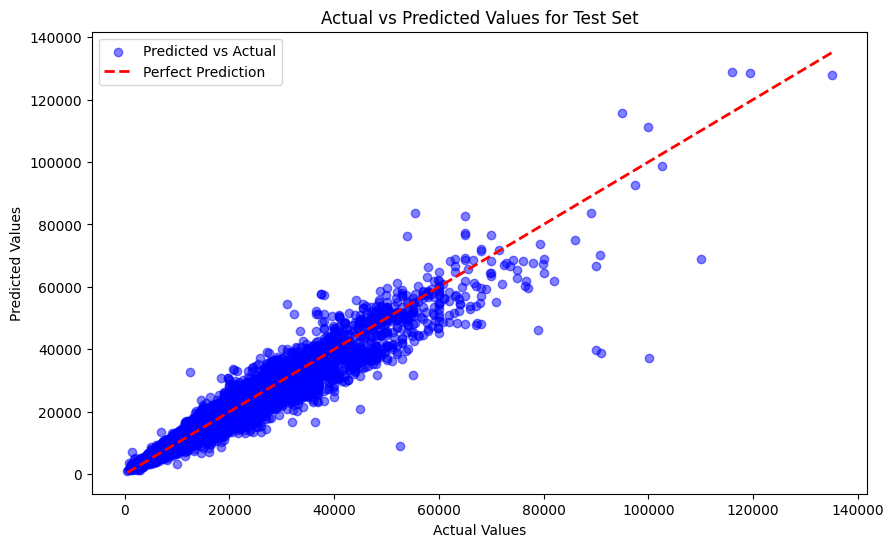

In [74]:
# Plotting y_test vs y_pred_test
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, alpha=0.5, color='blue', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', linewidth=2, label='Perfect Prediction')

# Add labels and title
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values for Test Set')
plt.legend()

In [75]:
X_train_val.columns

Index(['mileage', 'tax', 'mpg', 'engineSize', 'Car_Age', 'model_ 1 Series',
       'model_ 2 Series', 'model_ 3 Series', 'model_ 4 Series',
       'model_ 5 Series',
       ...
       'fuelType_Petrol', 'brand_audi', 'brand_bmw', 'brand_ford',
       'brand_hyundai', 'brand_merc', 'brand_skoda', 'brand_toyota',
       'brand_vauxhall', 'brand_vw'],
      dtype='object', length=218)

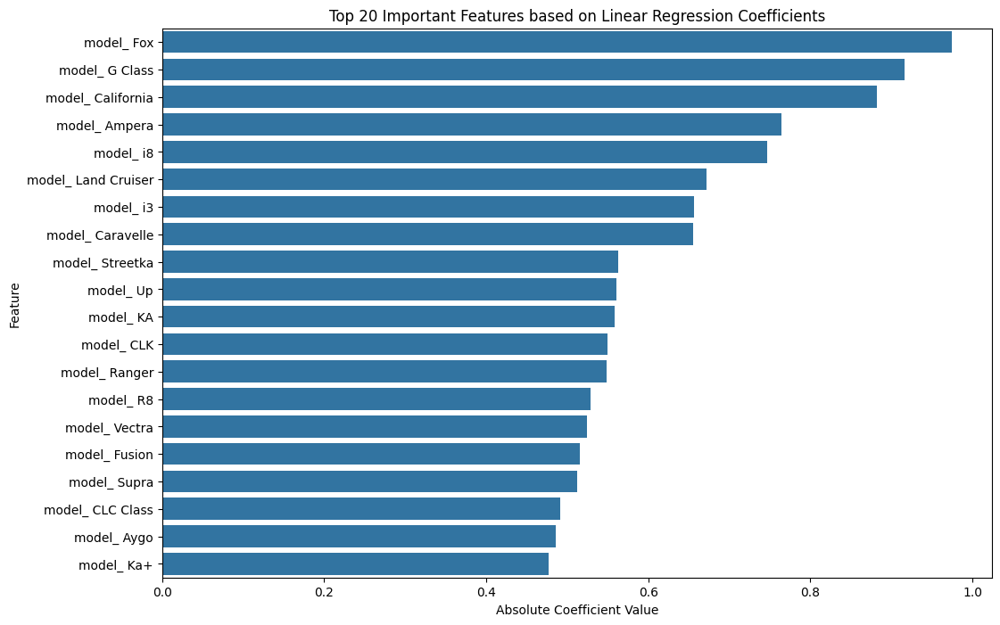

In [76]:
# Calculate feature importance based on coefficients for Linear Regression

feature_importance = pd.Series(np.abs(lr.coef_), index=X_train_val.columns)

# Sort the feature importance in descending order and select the top 20 features
top_20_features = feature_importance.sort_values(ascending=False).head(20)

# Plot the top 20 feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x=top_20_features, y=top_20_features.index)
plt.title('Top 20 Important Features based on Linear Regression Coefficients')
plt.xlabel('Absolute Coefficient Value')
plt.ylabel('Feature')
plt.show()

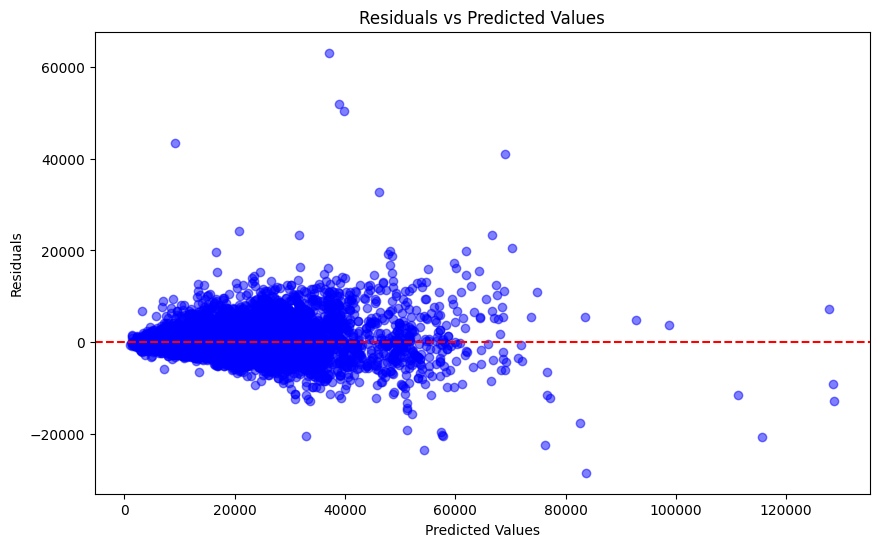

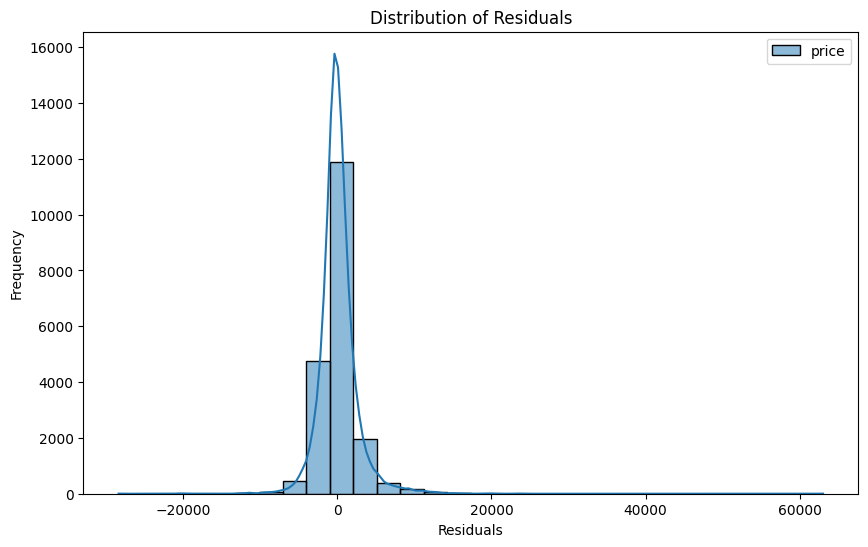

In [77]:
# Calculate residuals
residuals = y_test - y_pred_test

# Plot the residuals vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals, alpha=0.5, color='blue')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# Plot a histogram of the residuals to check their distribution
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30, color='blue')
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

Number of outliers in training set: 930
Proportion of outliers in training set: 0.0117


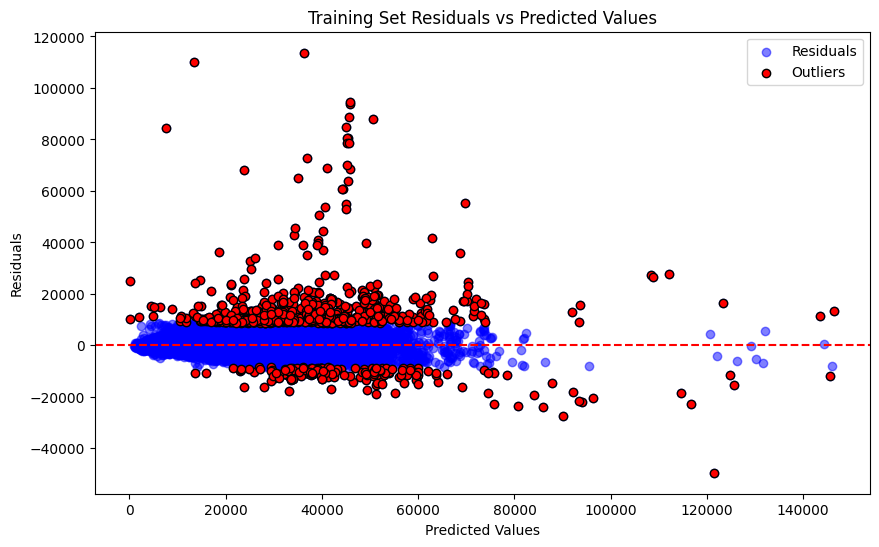

In [78]:
# Calculate residuals for the training set
y_pred_train_val_log = lr.predict(X_train_val)
y_pred_train_val = np.exp(y_pred_train_val_log)
y_train_val = np.exp(y_train_val_log)
# Calculate residuals for the training set
train_residuals = y_train_val - y_pred_train_val

# Determine outliers in the training set
train_residuals_mean = np.mean(train_residuals)
train_residuals_std = np.std(train_residuals)
train_outliers = np.abs(train_residuals - train_residuals_mean) > 3 * train_residuals_std

# Number of outliers
print(f"Number of outliers in training set: {np.sum(train_outliers)}")

# Proportion of outliers
print(f"Proportion of outliers in training set: {np.sum(train_outliers) / len(train_residuals):.4f}")

# Plot residuals with outliers highlighted for training set
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_val, train_residuals, alpha=0.5, label='Residuals', color='blue')
plt.scatter(y_pred_train_val[train_outliers], train_residuals[train_outliers], color='red', label='Outliers', edgecolor='k')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Training Set Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.legend()
plt.show()


In [79]:
train_non_outliers_mask = np.abs(train_residuals - train_residuals_mean) <= 3 * train_residuals_std

In [80]:
# Filter the datasets to keep only non-outliers
X_train_val_less_outlier = X_train_val[train_non_outliers_mask]
y_train_val_less_outlier = y_train_val[train_non_outliers_mask]

In [81]:
y_train_val_less_outlier

89591    19495.0
68219     8383.0
16980    18331.0
24493    12491.0
11335    19998.0
          ...   
6265     32950.0
54886    33298.0
76820     5000.0
860      20990.0
15795    30495.0
Name: price, Length: 78418, dtype: float64

In [82]:
# Instantiate the Linear Regression model
lr_model_less_outlier = LinearRegression()
y_train_val_less_outlier_log = np.log(y_train_val_less_outlier)
# Train the model on the cleaned training dataset
lr_model_less_outlier.fit(X_train_val_less_outlier, y_train_val_less_outlier_log)

# Make predictions on the cleaned test set
y_pred_test_less_outlier_log = lr_model_less_outlier.predict(X_test)

y_pred_test_less_outlier = np.exp(y_pred_test_less_outlier_log)
# Calculate the Mean Absolute Percentage Error (MAPE) on the cleaned test set
mape_lr = mean_absolute_percentage_error(y_test, y_pred_test_less_outlier)

# Display the MAPE
print(f"Mean Absolute Percentage Error (MAPE) on the cleaned test set: {mape_lr:.4f}")

Mean Absolute Percentage Error (MAPE) on the cleaned test set: 0.0958


In [83]:
# Retrieve the coefficients (weights) of the linear regression model
coefficients = lr.coef_

# Retrieve the intercept of the linear regression model
intercept = lr.intercept_

# Display the coefficients and intercept
print("Coefficients:", coefficients)
print("Intercept:", intercept)

Coefficients: [-5.82970071e-06 -1.48020155e-04 -1.54233574e-03  2.23114033e-01
 -9.94438899e-02 -4.06558378e-01 -3.78814056e-01 -2.88976061e-01
 -2.64688484e-01 -2.09630009e-01 -1.77036646e-01 -2.12228840e-02
  2.34149804e-01 -1.49029646e-01 -3.75735404e-01 -2.16792796e-01
 -2.51624769e-01 -2.23877537e-01 -1.49317681e-01 -1.06420515e-01
 -9.98607244e-02 -4.63879225e-02 -4.06228162e-01 -2.29282702e-01
 -4.10660809e-01  1.54381483e-01 -1.13867249e-13  7.64307103e-01
 -2.91670373e-02  1.03613951e-01 -2.08462527e-02 -1.50595594e-01
 -1.10317804e-01 -4.85445830e-01 -2.48828965e-01 -2.50438781e-01
 -1.52107294e-01 -7.45041221e-02  6.67778571e-02 -1.24362633e-01
 -9.88665825e-02 -5.89763105e-02 -4.31940475e-02 -4.90768055e-01
 -5.49087542e-01  1.61454721e-02  6.36134116e-02 -9.33063516e-02
 -1.27806418e-03 -1.19961632e-01  8.81504612e-01 -1.32460593e-01
  6.55580578e-01  1.78186212e-01 -4.41920088e-01  1.30159646e-01
 -7.49075705e-02 -2.58446815e-01 -5.43171701e-03 -1.87139580e-02
 -6.3105287

#### K-Fold Cross-Validation

In [84]:
# Assuming X_train_val and y_train_val are already defined
kf = KFold(n_splits=5, shuffle=True, random_state=42)
mse_scores = []
r2_scores = []
mape_scores = []
X_scaled = X_scaled.reset_index(drop=True)
y = y.reset_index(drop=True)
# Custom cross-validation loop
for train_index, val_index in kf.split(X_scaled):
    X_train, X_val = X_scaled.iloc[train_index], X_scaled.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Log-transform the target variable
    y_train_log = np.log(y_train)

    # Train the model
    lr = LinearRegression()
    lr.fit(X_train, y_train_log)

    # Predict and back-transform the predictions
    y_val_pred_log = lr.predict(X_val)
    y_val_pred = np.exp(y_val_pred_log)

    # Calculate metrics
    mse_scores.append(mean_squared_error(y_val, y_val_pred))
    r2_scores.append(r2_score(y_val, y_val_pred))
    mape_scores.append(mean_absolute_percentage_error(y_val, y_val_pred))

# Output the cross-validation results
print(f'Cross-validation MSE scores for each fold: {mse_scores}')
print(f'Average Cross-validation MSE: {np.mean(mse_scores)}')

print(f'Cross-validation R² scores for each fold: {r2_scores}')
print(f'Average Cross-validation R²: {np.mean(r2_scores)}')

print(f'Cross-validation MAPE scores for each fold: {mape_scores}')
print(f'Average Cross-validation MAPE: {np.mean(mape_scores)}')

Cross-validation MSE scores for each fold: [6759186.190767159, 7335097.727247299, 8410897.745084742, 9002405.747989528, 9188138.49965709]
Average Cross-validation MSE: 8139145.1821491625
Cross-validation R² scores for each fold: [0.9291827083644334, 0.9219257398243438, 0.9156898725822331, 0.908937008920021, 0.9069279459514434]
Average Cross-validation R²: 0.9165326551284949
Cross-validation MAPE scores for each fold: [0.09641567776369295, 0.09609273862314295, 0.09706586319216665, 0.09556891282344578, 0.09638596456083341]
Average Cross-validation MAPE: 0.09630583139265635


###KMeans

In [85]:
# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

#Feature engineering for model 3
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_features=df.select_dtypes(include=['number']).columns.tolist()

# Fit and transform the categorical features of the training set
df_cat = pd.DataFrame(encoder.fit_transform(df[categorical_features]), columns=encoder.get_feature_names_out(categorical_features))

# Reset index to avoid index misalignment issues
df_cat.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)

# Concatenate the transformed categorical features and the original numerical features
df = pd.concat([df_cat,df[numerical_features]], axis=1)

print('df shape after onehot',df.shape)

df shape after onehot (99187, 219)


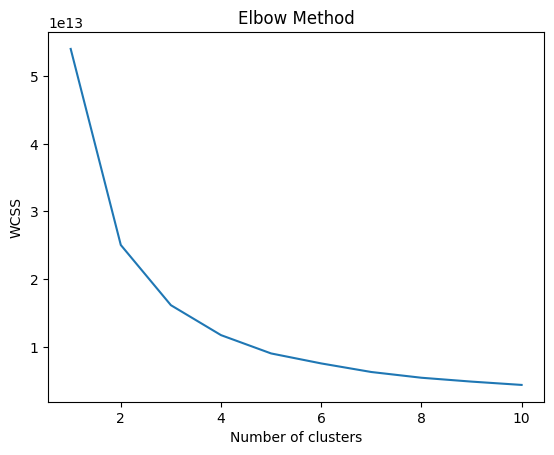

In [86]:
# KMeans - how many clusters?
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [87]:
#KMeans Clustering and Imputation using Cluster Average - optimal clusters = 10 from elbow method above

#Before imputation
print('Before:')
print(df[numerical_features].isnull().sum())
print((df['tax'] == 0).sum())
print((df['mpg'] == 0).sum())
print((df['engineSize'] == 0).sum())
print('average of tax before imputation',df['tax'].mean())
print('average of engineSize before imputation',df['engineSize'].mean())

#impute zero values and nulls with cluster average
# List of features including the target variable 'price' but without the two features that have a lot of 0s to impute
features = df.drop(columns=['tax','engineSize']).columns.tolist()

# Perform KMeans clustering with the optimal number of clusters 3
n_clusters = 10
#calculate clusters using KMeans then assign cluster labels to each row
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
df['cluster_labels'] = kmeans.fit_predict(df[features])

# Function to impute cluster averages
def impute_cluster_average(df, column, cluster_column):
    #list of unique cluster values in column
    clusters = df[cluster_column].unique()
    #for each cluster
    for cluster in clusters:
        #get all of the data in one cluster
        cluster_data = df[df[cluster_column] == cluster]
        #compute the cluster mean that is non-zero
        cluster_mean = cluster_data[column][cluster_data[column] != 0].mean()

        # Handle NaN values: Replace NaN cluster mean with global mean or another default value
        if pd.isna(cluster_mean):
            #if the cluster mean is null use the overall average of the column
            cluster_mean = df[column][df[column] != 0].mean()
        #replace 0s in the column within the cluster with the cluster mean
        df.loc[(df[cluster_column] == cluster) & (df[column] == 0), column] = cluster_mean
    return df

# Impute cluster averages for the 'column_to_impute'
df = impute_cluster_average(df, 'tax', 'cluster_labels')
df = impute_cluster_average(df, 'engineSize', 'cluster_labels')

print('average of tax after imputation',df['tax'].mean())
print('average of engineSize after imputation',df['engineSize'].mean())

Before:
year          0
price         0
mileage       0
tax           0
mpg           0
engineSize    0
dtype: int64
6294
0
273
average of tax before imputation 120.29983768034117
average of engineSize before imputation 1.6632804702229118


<ipython-input-87-254f353fcbfd>:38: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '122.56216315531603' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[(df[cluster_column] == cluster) & (df[column] == 0), column] = cluster_mean


average of tax after imputation 127.53707934697032
average of engineSize after imputation 1.667857956259701


In [88]:
#Split labels
column_names_list = list(df.columns)
column_names_list.remove('price')
X_train=df[column_names_list]
Y_train=df['price']

# Split the data into training and validation sets 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Verify the shape of the concatenated dataframes
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")

# Print the shapes of the target dataframes
print(f"y_train shape: {y_train.shape}")
print(f"y_val shape: {y_val.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (59511, 219)
X_val shape: (19838, 219)
X_test shape: (19838, 219)
y_train shape: (59511,)
y_val shape: (19838,)
y_test shape: (19838,)


In [89]:
# #Do not run this cell
# #Do not run this cell
# #Do not run this cell
# #Do not run this cell

# #We will be scaling numerical features including one-hot encoded categorical features

# #scale all numerical features and y data
# from sklearn.preprocessing import StandardScaler

# #inititalize scaler
# scaler=StandardScaler()

# #store categorical columns and numerical as a list
# categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
# numerical_features=X_train.select_dtypes(include=['number']).columns.tolist()

# # Fit and transform the numerical features of the training set
# X_train = pd.DataFrame(scaler.fit_transform(X_train[numerical_features]), columns=numerical_features)
# X_test = pd.DataFrame(scaler.transform(X_test[numerical_features]), columns=numerical_features)
# X_val = pd.DataFrame(scaler.transform(X_val[numerical_features]), columns=numerical_features)

# # Verify the shape of the concatenated dataframes
# print(f"X_train shape: {X_train.shape}")
# print(f"X_val shape: {X_val.shape}")
# print(f"X_test shape: {X_test.shape}")

# #scale y
# y_train=scaler.fit_transform(np.array(y_train).reshape(-1,1))
# y_test=scaler.fit_transform(np.array(y_test).reshape(-1,1))
# y_val=scaler.fit_transform(np.array(y_val).reshape(-1,1))

# # Print the shapes of the target dataframes
# print(f"y_train shape: {y_train.shape}")
# print(f"y_val shape: {y_val.shape}")
# print(f"y_test shape: {y_test.shape}")

# #shapes should match before because we are label encoding instead of one-hot encoding

In [90]:
#Linear Regression model post data processing
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model using MAPE and R^2
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAPE: {mape:.4f}')
print(f'R^2: {r2:.4f}')

#MAPE to beat is 28%

MAPE: 0.1777
R^2: 0.8655


In [91]:
#random forest

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_absolute_percentage_error

# Initialize the model
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_regressor.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = rf_regressor.predict(X_val)

# Predict on the validation set
y_test_pred = rf_regressor.predict(X_test)

# Calculate MAPE on the validation set
val_mape = mean_absolute_percentage_error(y_val, y_val_pred)
print(f'Validation MAPE: {val_mape:.2%}')
# Calculate MAPE on the test set
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)
print(f'Test MAPE: {test_mape:.2%}')


#7.38%

#7.01% one-hot encode, KMeans cluster average impute

Validation MAPE: 7.02%
Test MAPE: 7.09%


###XGBoost

In [92]:
#XGBoost

import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error

# Convert to DMatrix
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set parameters
params = {
    'booster': 'gbtree',
    'objective': 'reg:squarederror',  # For regression
    'eta': 0.1,
    'max_depth': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8
}

# Train the model
bst = xgb.train(params, dtrain, num_boost_round=100)

# Make predictions
y_pred = bst.predict(dtest)

# Evaluate the model using MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)
print(f'MAPE: {mape:.4f}')

#6.93%

#6.5%

MAPE: 0.0655


In [93]:
# Set up k-fold cross-validation
from sklearn.metrics import mean_absolute_percentage_error, make_scorer
k = 5
kf = KFold(n_splits=k, shuffle=True, random_state=42)

# Set parameters
params = {
    'booster': 'gbtree',
    'objective': 'reg:squarederror',  # For regression
    'eta': 0.1,
    'max_depth': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8
}

# Create the XGBRegressor model
model = xgb.XGBRegressor(**params, n_estimators=100)

# Custom scorer for MAPE
mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False)

# Perform cross-validation
mape_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=mape_scorer)

# Convert negative MAPE to positive values
mape_scores = -mape_scores

# Calculate average MAPE across all folds
average_mape = np.mean(mape_scores)

print(f'Average MAPE: {average_mape:.4f}')

Average MAPE: 0.0666


In [94]:
#XGBoost optimized

import xgboost as xgb
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_percentage_error

# Set up the parameter grid
param_grid = {
    'learning_rate': [0.01,  0.1],
    'max_depth': [15, 25],
    'min_child_weight': [1,  5],
    'subsample': [0.6,  1.0],
    'colsample_bytree': [0.6, 1.0],
    'n_estimators': [100,  300]
}

# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_jobs=-1)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='neg_mean_absolute_percentage_error', cv=3, verbose=1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = -grid_search.best_score_

print(f"Best parameters found: {best_params}")
print(f"Best MAPE: {best_score:.4f}")

# Train the final model with the best parameters
final_model = xgb.XGBRegressor(objective='reg:squarederror', **best_params)
final_model.fit(X_train, y_train)

# Make predictions
y_pred = final_model.predict(X_test)

# Evaluate the model using MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)
print(f'MAPE on test data: {mape:.4f}')

Fitting 3 folds for each of 64 candidates, totalling 192 fits
Best parameters found: {'colsample_bytree': 0.6, 'learning_rate': 0.1, 'max_depth': 15, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 1.0}
Best MAPE: 0.0671
MAPE on test data: 0.0659


### Feedforward Neural Network (FNN)

In [95]:
#try a model with dropouts and early stopping
model_fnn_2 = Sequential([
    Dense(128, input_dim=X_train.shape[1], activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1, activation='linear')
])

# Compile the model
model_fnn_2.compile(optimizer='adam', loss='mean_absolute_percentage_error')

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model_fnn_2.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stopping], verbose=True)

# Make predictions
y_pred = model_fnn_2.predict(X_test)

# Evaluate the model using MAPE and R^2
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MAPE: {mape:.4f}')
print(f'R^2: {r2:.4f}')

# 18%

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 47.0842 - val_loss: 36.7462
Epoch 2/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 35.8985 - val_loss: 34.5636
Epoch 3/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 35.1271 - val_loss: 34.1350
Epoch 4/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 34.5534 - val_loss: 31.9198
Epoch 5/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 33.2228 - val_loss: 34.5450
Epoch 6/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 30.4271 - val_loss: 22.3340
Epoch 7/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 24.5971 - val_loss: 20.9395
Epoch 8/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 23.3252 - val_loss: 19.4419
Epoch 9/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 22.8704 - val_loss: 22.3293
Epoch 10/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 22.1099 - val_loss: 19.7662
Epoch 11/100
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 21.9204 - val_loss: 18.7

In [96]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_percentage_error, r2_score
import numpy as np

# Set up k-fold cross-validation
k = 5
kf = KFold(n_splits=k, shuffle=True, random_state=42)

mape_scores = []
r2_scores = []
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
# Cross-validation loop
for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Define the model
    model_fnn_2 = Sequential([
        Dense(128, input_dim=X_train.shape[1], activation='relu'),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])

    # Compile the model
    model_fnn_2.compile(optimizer='adam', loss='mean_absolute_percentage_error')

    # Early stopping callback
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Train the model
    history = model_fnn_2.fit(X_train_fold, y_train_fold,
                              epochs=100,
                              batch_size=32,
                              validation_data=(X_val_fold, y_val_fold),
                              callbacks=[early_stopping],
                              verbose=0)

    # Evaluate the model on the test set
    y_pred = model_fnn_2.predict(X_test)

    # Calculate the MAPE and R^2 scores
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    mape_scores.append(mape)
    r2_scores.append(r2)

# Calculate average scores across all folds
average_mape = np.mean(mape_scores)
average_r2 = np.mean(r2_scores)

print(f'Average MAPE: {average_mape:.4f}')
print(f'Average R^2: {average_r2:.4f}')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


620/620 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


620/620 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


620/620 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


620/620 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


620/620 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Average MAPE: 0.1836
Average R^2: 0.7050


In [97]:
## Notes

## Why does scaling reduce performance?

## What should the order be -> clean, one-hot encode, impute, split, train, test, deploy?

## how do we know we have a final model?



### Decision Tree

#### Data Aggregation

Different files are merged together, additional 'manufacturer column' is added to create a key feature. 'Has_tax' column is also created to indicate if the column was missing in the initial file.

In [98]:
# Plotly libraries
!pip install pycaret
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots

# Machine learning library
from pycaret.regression import *

In [99]:
audi['has_tax'] = 1
bmw['has_tax'] = 1
hyundai['has_tax'] = 1
merc['has_tax'] = 1
skoda['has_tax'] = 1
toyota['has_tax'] = 1
vauxhall['has_tax'] = 1
ford['has_tax'] = 1
vw['has_tax'] = 1

In [100]:
# aggregation
cars = pd.concat([audi, bmw, hyundai, merc, skoda, toyota, vauxhall, ford, vw], ignore_index=True)

# dimensionality
cars.shape

(99187, 11)

In [101]:
cars

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand,has_tax
0,A1,2017,12500,Manual,15735,Petrol,150,55.4,1.4,audi,1
1,A6,2016,16500,Automatic,36203,Diesel,20,64.2,2.0,audi,1
2,A1,2016,11000,Manual,29946,Petrol,30,55.4,1.4,audi,1
3,A4,2017,16800,Automatic,25952,Diesel,145,67.3,2.0,audi,1
4,A3,2019,17300,Manual,1998,Petrol,145,49.6,1.0,audi,1
...,...,...,...,...,...,...,...,...,...,...,...
99182,Eos,2012,5990,Manual,74000,Diesel,125,58.9,2.0,vw,1
99183,Fox,2008,1799,Manual,88102,Petrol,145,46.3,1.2,vw,1
99184,Fox,2009,1590,Manual,70000,Petrol,200,42.0,1.4,vw,1
99185,Fox,2006,1250,Manual,82704,Petrol,150,46.3,1.2,vw,1


In [102]:
print(cars.isnull().sum())

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
has_tax         0
dtype: int64


In [103]:
# Impute missing values with the median
cars['tax'].fillna(cars['tax'].median(), inplace=True)
cars['mpg'].fillna(cars['mpg'].median(), inplace=True)

In [104]:
print(cars.isnull().sum())

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
has_tax         0
dtype: int64


In [105]:
summary = cars.describe()
summary.T

,count,mean,std,min,25%,50%,75%,max
year,99187.0,2017.087723,2.123934,1970.0,2016.0,2017.0,2019.0,2060.0
price,99187.0,16805.347656,9866.773417,450.0,9999.0,14495.0,20870.0,159999.0
mileage,99187.0,23058.914213,21148.523721,1.0,7425.0,17460.0,32339.0,323000.0
tax,99187.0,120.299838,63.150926,0.0,125.0,145.0,145.0,580.0
mpg,99187.0,55.166825,16.138522,0.3,47.1,54.3,62.8,470.8
engineSize,99187.0,1.663280,0.557646,0.0,1.2,1.6,2.0,6.6
has_tax,99187.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0


Summary statistics look mostly normal, the minimum mpg (0.3 mpg) value looks off, as well as the max year (2060).

In [106]:
cars = cars[cars['year'] <= 2020]
cars = cars[cars['mpg'] >= 5]
cars.shape

(99167, 11)

#### EDA

In [107]:
# Count cars per manufacturer
fig = px.histogram(cars, x="brand", hover_data=cars.columns)
fig.update_layout(title='Quantitative representation of the number of vehicles per manufacturer')
fig.show()

In [108]:
# Price
fig = px.histogram(cars, x="price", marginal="box")
fig.update_layout(title='Statistical Distribution of Price')
fig.show()

In [109]:
# Year
fig = px.histogram(cars, x="year", marginal="box")
fig.update_layout(title='Statistical Distribution of Year')
fig.show()

Note the 1970 data point

In [110]:
# MPG
fig = px.histogram(cars, x="mpg", marginal="box")
fig.update_layout(title='Statistical Distribution of Miles Per Gallon')
fig.show()

Note the 470 mpg data point

In [111]:
# Total mileage
fig = px.histogram(cars, x="mileage", marginal="box")
fig.update_layout(title='Statistical Distribution of Mileage')
fig.show()

Many cars with 0 or 1 mile?

In [112]:
# Engine size
fig = px.histogram(cars, x="engineSize", marginal="box")
fig.update_layout(title='Statistical Distribution of Engine Size')
fig.show()

#### Let's look at each feature in relation to price

In [113]:
# Manufacturer vs Price
fig = px.scatter(cars, x='brand', y='price', color='price')
fig.update_layout(title='Sales Price VS Manufacturer',xaxis_title="Manufacturer",yaxis_title="Price")
fig.show()

As expected, German cars generally trend in the higher prices

In [114]:
# Mileage vs Price
fig = px.scatter(cars, x='mileage', y='price', color='price')
fig.update_layout(title='Sales Price VS Mileage',xaxis_title="Mileage",yaxis_title="Price")
fig.show()

Lower miles = retain value

In [115]:
# Transmission vs Price
fig = px.scatter(cars, x='transmission', y='price', color='price')
fig.update_layout(title='Sales Price VS Transmission System',xaxis_title="Transmission",yaxis_title="Price")
fig.show()

#### Baseline modeling

In [116]:
cars.columns

Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize', 'brand', 'has_tax'],
      dtype='object')

In [117]:
# Define the features (X) and the target (y)
X = cars.drop(columns=['price'], axis=1)
y = cars['price']

# Convert categorical variables to dummy variables
X = pd.get_dummies(X, drop_first=True)

# Split the data into training, validation, and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [118]:
rf = RandomForestRegressor(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [10, 20, 30, 40, 50, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# RandomizedSearchCV setup
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model
rf_random.fit(X_train, y_train)

# Evaluate on the validation set
best_rf = rf_random.best_estimator_

# Make predictions on the validation set
y_val_pred = best_rf.predict(X_val)

# Evaluate the model on the validation set
val_mape = mean_absolute_percentage_error(y_val, y_val_pred)
print(f'Validation Mean Absolute Percentage Error (MAPE): {val_mape:.2%}')

# Train the final model on the combined training and validation sets
best_rf.fit(X_train_full, y_train_full)

# Make predictions on the test set
y_test_pred = best_rf.predict(X_test)

# Evaluate the model on the test set
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)
print(f'Test Mean Absolute Percentage Error (MAPE): {test_mape:.2%}')

# Display the best parameters
print(f'Best Parameters: {rf_random.best_params_}')

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Validation Mean Absolute Percentage Error (MAPE): 7.41%
Test Mean Absolute Percentage Error (MAPE): 7.17%
Best Parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': False}


In [119]:
y_train_pred = best_rf.predict(X_train)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
print(f'Training Mean Absolute Percentage Error (MAPE): {train_mape:.2%}')

Training Mean Absolute Percentage Error (MAPE): 4.43%


The model seems to be performing quite well, let's take a look at feature importance and residuals.

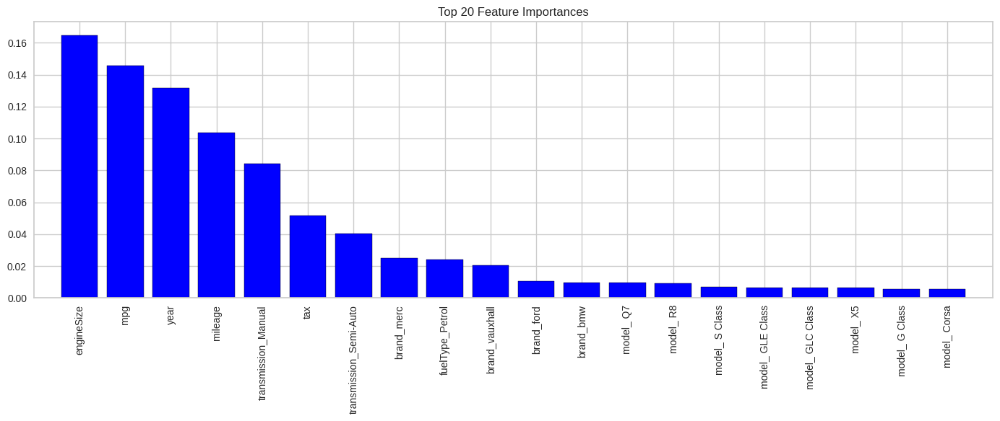

In [120]:
# Get feature importances
importances = best_rf.feature_importances_
indices = np.argsort(importances)[::-1]
features = X.columns

# Select top 20 features
top_n = 20
top_indices = indices[:top_n]
top_features = features[top_indices]
top_importances = importances[top_indices]

# Plot the feature importances for top 20 features
plt.figure(figsize=(14, 6))
plt.title("Top 20 Feature Importances")
plt.bar(range(top_n), top_importances, align="center", color='blue', edgecolor='black')
plt.xticks(range(top_n), top_features, rotation=90)
plt.xlim([-1, top_n])
plt.tight_layout()
plt.show()


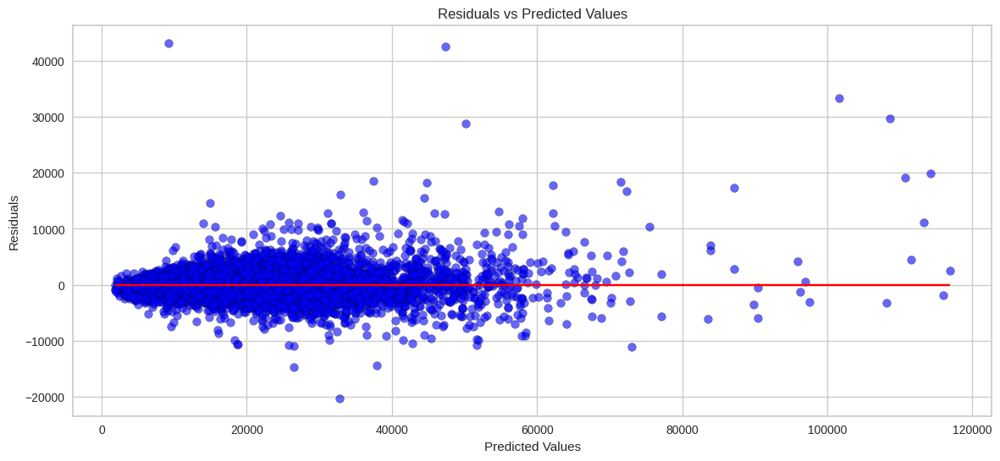

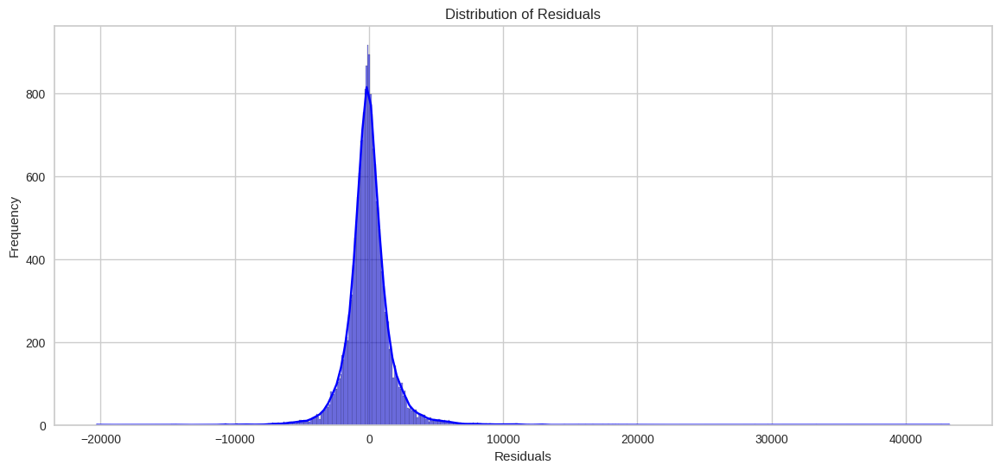

In [121]:
# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.figure(figsize=(14, 6))
plt.scatter(y_test_pred, residuals, color='blue', edgecolor='black', alpha=0.6)
plt.hlines(y=0, xmin=min(y_test_pred), xmax=max(y_test_pred), colors='red')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# Plot distribution of residuals
plt.figure(figsize=(14, 6))
sns.histplot(residuals, kde=True, color='blue')
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

Looks like many of the residuals are centered around 0, indicating good model performance. However, there are some noticeable outliers, suggesting some struggle with certain predictions.

Let's remove some outliers from the original dataset, as well as tune some hyperparameters

In [122]:
cars.shape

(99167, 11)

In [123]:
cars = cars[cars['price'] <= 200000]
cars = cars[cars['mileage'] <= 200000]

In [124]:
cars = cars[cars['year'] >= 2000]

In [125]:
cars.shape

(99136, 11)

Based on the best parameters from the Randomized Search, let's create a more focused parameter grid and iterate using GridSearchCV - a more exhaustive search.

In [126]:
# Define the features (X) and the target (y)
X = cars.drop(columns=['price'], axis=1)
y = cars['price']

# Convert categorical variables to dummy variables
X = pd.get_dummies(X, drop_first=True)

# Split the data into training, validation, and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [127]:
from sklearn.model_selection import GridSearchCV

# Refined parameter grid based on Randomized Search results
param_grid = {
    'n_estimators': [150, 200, 250],
    'max_features': ['sqrt'],
    'max_depth': [40, 50, 60],
    'min_samples_split': [8, 10, 12],
    'min_samples_leaf': [1, 2],
    'bootstrap': [False]
}

# GridSearchCV setup
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the grid search model
rf_grid.fit(X_train, y_train)

# Get best estimator
best_rf_grid = rf_grid.best_estimator_

# Training MAPE
y_train_pred = best_rf_grid.predict(X_train)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
print(f'Training Mean Absolute Percentage Error (MAPE): {train_mape:.2%}')

# Evaluate on validation set
y_val_pred = best_rf_grid.predict(X_val)
val_mape_grid = mean_absolute_percentage_error(y_val, y_val_pred)
print(f'Validation MAPE with GridSearchCV: {val_mape_grid:.2%}')

# Train the final model on the combined training and validation sets
best_rf_grid.fit(X_train_full, y_train_full)

# Evaluate on test set
y_test_pred = best_rf_grid.predict(X_test)
test_mape_grid = mean_absolute_percentage_error(y_test, y_test_pred)
print(f'Test MAPE with GridSearchCV: {test_mape_grid:.2%}')

# Best parameters from Grid Search
print(f'Best Parameters from Grid Search: {rf_grid.best_params_}')


Fitting 3 folds for each of 54 candidates, totalling 162 fits
Training Mean Absolute Percentage Error (MAPE): 4.05%
Validation MAPE with GridSearchCV: 7.34%
Test MAPE with GridSearchCV: 7.29%
Best Parameters from Grid Search: {'bootstrap': False, 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 200}


In [128]:
import optuna

def objective(trial):
    # Suggest hyperparameters
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    max_depth = trial.suggest_int('max_depth', 10, 100)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2'])
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])

    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        bootstrap=bootstrap,
        random_state=42
    )

    rf.fit(X_train, y_train)
    y_val_pred = rf.predict(X_val)
    val_mape = mean_absolute_percentage_error(y_val, y_val_pred)
    return val_mape

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Best parameters from Optuna
print(f'Best Parameters from Optuna: {study.best_params}')

# Train the final model with best parameters
best_rf_optuna = RandomForestRegressor(**study.best_params, random_state=42)
best_rf_optuna.fit(X_train_full, y_train_full)

# Evaluate on test set
y_test_pred = best_rf_optuna.predict(X_test)
test_mape_optuna = mean_absolute_percentage_error(y_test, y_test_pred)
print(f'Test MAPE with Optuna: {test_mape_optuna:.2%}')


ModuleNotFoundError: No module named 'optuna'

In [ ]:
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor, AdaBoostRegressor

# Define base models
base_models = [
    ('rf', RandomForestRegressor(**study.best_params, random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42)),
    ('ab', AdaBoostRegressor(random_state=42))
]

# Define stacking ensemble
stacked_model = StackingRegressor(estimators=base_models, final_estimator=RandomForestRegressor(random_state=42))

# Train stacking model
stacked_model.fit(X_train_full, y_train_full)

# Evaluate on test set
y_test_pred = stacked_model.predict(X_test)
test_mape_stacking = mean_absolute_percentage_error(y_test, y_test_pred)
print(f'Test MAPE with Stacking: {test_mape_stacking:.2%}')

In [ ]:
from sklearn.model_selection import cross_val_score

# Cross-validation with more folds
cv_scores = cross_val_score(best_rf_optuna, X_train_full, y_train_full, cv=5, scoring='neg_mean_absolute_percentage_error')
cv_mape = -np.mean(cv_scores)
print(f'Cross-Validation MAPE: {cv_mape:.2%}')
